# Module 4: Deep Learning

## Sprint 1: Computer Vision

## Know Your Mushrooms

<div style="text-align:center">
<div><img style="width:400px" src="https://i.pinimg.com/originals/9b/ed/89/9bed89fee3e35c30bbc30f9e9d82b859.jpg"></img><div>
<div style="margin-bottom:20px; color:rgb(117, 117, 117);font-size:12px;">Source: https://www.pinterest.com/pin/597641813035305267/</div>
</div>

## Background

In US alone, around 7500 yearly cases of mushrooms poisoning are reported [(Source)](https://www.tandfonline.com/doi/full/10.1080/00275514.2018.1479561). According to the source, "misidentification of edible mushroom species appears to be the most common cause and may be preventable through education". To avoid expenses for hospitalization and in some cases pointless deaths, you have been hired by US National Health Service to create a machine learning model, that can recognize mushroom types. They want to install this on hand-held devices and to help people make the right choice when mushroom picking. 

---

## Concepts to explore

Today, we will put everything we learned in this module and use it to solve a classification problem. The idea of this project is to use transfer learning on an architecture of your choice and fine-tune to predict mushroom types.

You will use this Kaggle dataset https://www.kaggle.com/maysee/mushrooms-classification-common-genuss-images

## How to start?

### Data
Well, the obvious first steps will be getting the data from Kaggle. There are a number of choices on how to do it, such as downloading images to your machine and then uploading to Drive or using [Kaggle API](https://github.com/Kaggle/kaggle-api). Once you get your data, start with an EDA, as this will directly feed into design choices for your architecture.

### Modeling

My suggestion is that you start with a simple pre-trained architecture, like ResNet18. This will allow you to fine-tune your net faster and if results are not too good, you can try switching to a larger model later. 
It is recommended that you use PyTorch Lightning or FastAI. Both are equally good for simple problems like this, but PyTorch Lightning will give you more control, better customization ability, and better understanding of your network.

## Requirements:

- Choose whichever framework you prefer from FastAI, PyTorch Lightning or PyTorch.
- As always - EDA
- Use a pre-trained neural net as a backbone of your class
- Train a classifier. Don't forget to fine-tune
- Evaluate inference time
- Visualize results

## Evaluation Criteria

- Model performance
  - Classification performance
  - Inference speed
- EDA and documented findings
- Results analysis
- Code quality

## Bonus challenges

- Repeat the process with modifications to your network and see how the results vary. 
  - Try a different optimizer
  - Add an intermediate layer between the backbone and output layer


## Sample correction questions

During a correction, you may get asked questions that test your understanding of covered topics.

- Describe how a convolutional layers works
- What is overfitting? Describe why is it bad/good and how to detect it?
- What is an optimizer? Describe in high level how it works.
- What are the advantages/disadvantages of transfer learning?

In [ ]:
from google.colab import drive

drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
import os
import shutil

try:
    os.mkdir("/root/.kaggle")
except:
    pass

shutil.copy("/content/drive/MyDrive/Kaggle/kaggle.json", "/root/.kaggle/kaggle.json")

'/root/.kaggle/kaggle.json'

In [ ]:
import numpy as np
import pandas as pd
import cv2
import torch
from sklearn.model_selection import train_test_split
import joblib

In [ ]:
%%capture
! pip install pytorch-lightning
! pip install kaggle
! kaggle datasets download -d maysee/mushrooms-classification-common-genuss-images
! unzip /content/mushrooms-classification-common-genuss-images.zip

# Data loading

I will preprocess the data by colecting all the paths to mushroom images and the muhsroom genuses.

Then split them stratified by genus into train, eval and test sets.


In [ ]:
base_dir = os.path.join(os.getcwd(), "Mushrooms")

data = []
for genus in os.listdir(base_dir):
    genus_path = os.path.join(base_dir, genus)
    for image in os.listdir(genus_path):
        image_path = os.path.join(genus_path, image)
        data.append([genus, image_path])

In [ ]:
# joblib.dump(data, "/content/drive/MyDrive/shroom_data.dump")
data = joblib.load("/content/drive/MyDrive/shroom_data.dump")

In [ ]:
genus, files = list(zip(*data))

In [ ]:
code_map = {
    0: "Agaricus",
    1: "Amanita",
    2: "Boletus",
    3: "Cortinarius",
    4: "Entoloma",
    5: "Hygrocybe",
    6: "Lactarius",
    7: "Russula",
    8: "Suillus",
}

genus_map = {item: key for key, item in code_map.items()}

In [ ]:
X_train, X_eval, y_train, y_eval = train_test_split(
    files, genus, stratify=genus, train_size=0.8, random_state=42
)
X_eval, X_test, y_eval, y_test = train_test_split(
    X_eval, y_eval, stratify=y_eval, train_size=0.7, random_state=42
)

In [ ]:
print(len(y_train))
print(len(y_eval))
print(len(y_test))

5371
940
403


# EDA


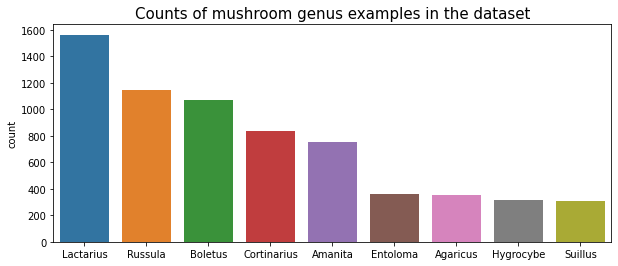

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize=(10, 4))
sns.countplot(x=list(genus), order=pd.Series(genus).value_counts().index)
ax.set_title("Counts of mushroom genus examples in the dataset", fontsize=15);

In [ ]:
from typing import List, Callable, Dict
from torch.utils.data import DataLoader, Dataset
from torchvision import models
from torchvision import transforms as T
import torch.nn.functional as F
from torch import nn


class Mushrooms(Dataset):
    def __init__(
        self,
        data: List[str],
        labels: List[int],
        num_map: Dict[str, int],
        trans: Callable,
    ):
        self.data = data
        self.labels = labels
        self.num_map = num_map
        self.trans = trans

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, ix: int):
        "Read and resize the image"
        image = cv2.imread(self.data[ix])
        image = cv2.resize(image, (224, 224))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        label = self.labels[ix]
        return image, label

    def image_trans(self, image: np.ndarray):
        image = torch.tensor(image / 255.0).permute(2, 0, 1)
        image = self.trans(image)
        return image

    def label_trans(self, label: str):
        code = self.num_map[label]
        return F.one_hot(torch.tensor(code), len(self.num_map))

    def collate_fn(self, batch):
        "Takes care of image prep for network"
        images, labels = [], []
        for img, lab in batch:
            images.append(self.image_trans(img))
            labels.append(self.label_trans(lab))
        return torch.stack(images).float(), torch.stack(labels).float()

For the traning data I will add variuos flips and perspective changes, the train and eval data will only by normalized.

In [ ]:
train_trans = T.Compose(
    [
        T.RandomVerticalFlip(),
        T.RandomHorizontalFlip(),
        T.RandomRotation(45),
        T.RandomPerspective(0.25),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)
val_trans = T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

In [ ]:
BATCH_SIZE = 32

train_set = Mushrooms(X_train, y_train, genus_map, train_trans)
train_loader = DataLoader(
    train_set,
    batch_size=BATCH_SIZE,
    shuffle=True,
    drop_last=True,
    pin_memory=True,
    num_workers=4,
    collate_fn=train_set.collate_fn,
)

eval_set = Mushrooms(X_eval, y_eval, genus_map, val_trans)
eval_loader = DataLoader(
    eval_set,
    batch_size=BATCH_SIZE,
    num_workers=4,
    pin_memory=True,
    collate_fn=eval_set.collate_fn,
)

test_set = Mushrooms(X_test, y_test, genus_map, val_trans)
test_loader = DataLoader(
    test_set, batch_size=len(y_test), num_workers=4, collate_fn=test_set.collate_fn
)

## Examples of mushroom genus in the dataset

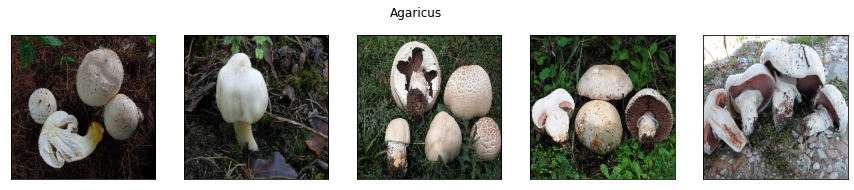

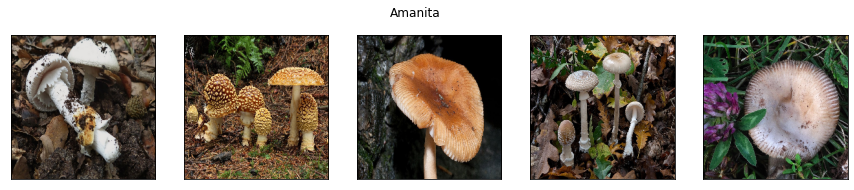

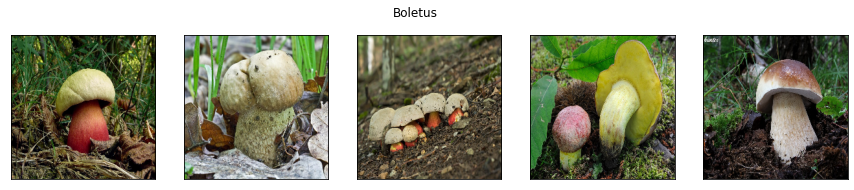

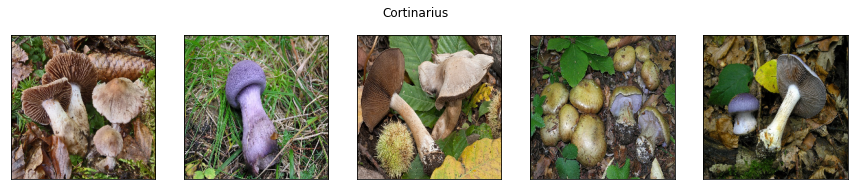

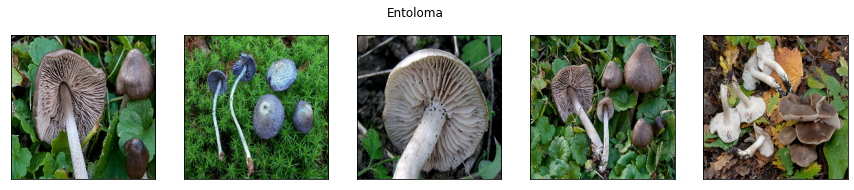

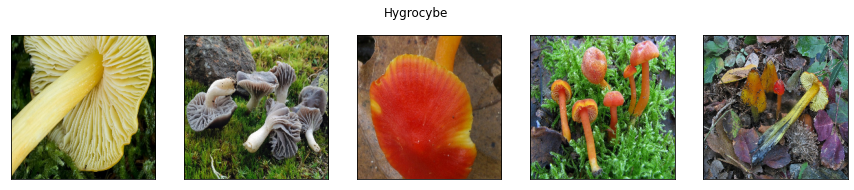

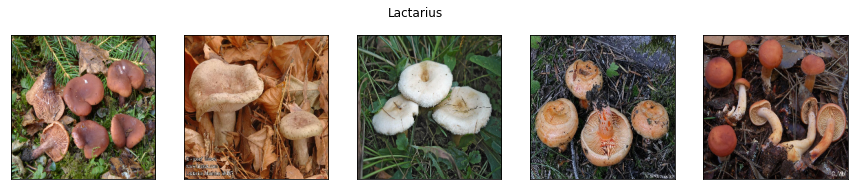

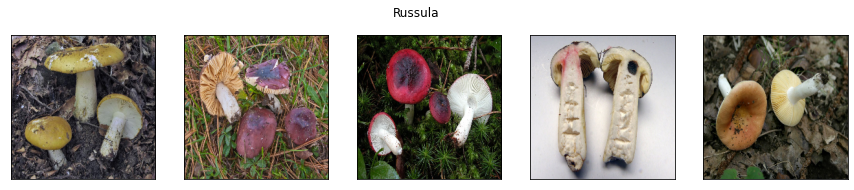

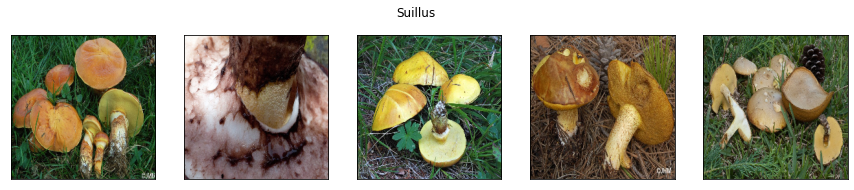

In [ ]:
for i in genus_map.keys():
    ids = np.array(y_train) == i
    ids = [i for i, j in enumerate(ids) if j]

    fig, ax = plt.subplots(1, 5, figsize=(15, 4))
    ax = ax.flatten()

    pl = np.random.choice(ids, 5, replace=False)
    for idx in range(len(pl)):
        ax[idx].imshow(train_set[pl[idx]][0])
        ax[idx].set_yticks([])
        ax[idx].set_xticks([])
    fig.suptitle(i, y=0.85);

## Images that the network receives for training

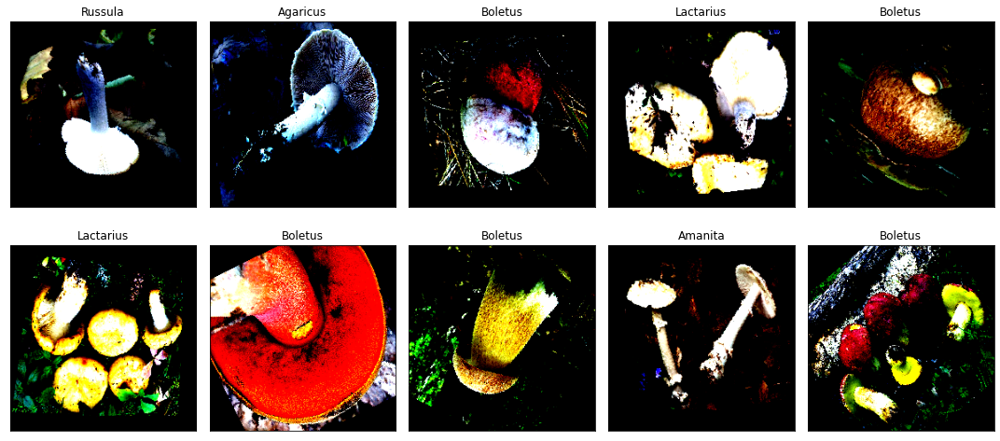

In [ ]:
xfig, ax = plt.subplots(2, 5, figsize=(15, 8))
ax = ax.flatten()

images, labels = next(iter(train_loader))
for idx, img in enumerate(images[:10]):
    ax[idx].imshow(img.permute(1, 2, 0).clip(0, 1))
    ax[idx].set_yticks([])
    ax[idx].set_xticks([])
    ax[idx].set_title(code_map[int(labels[idx].argmax())])
    plt.tight_layout()

## Images that network receives for validation and testing

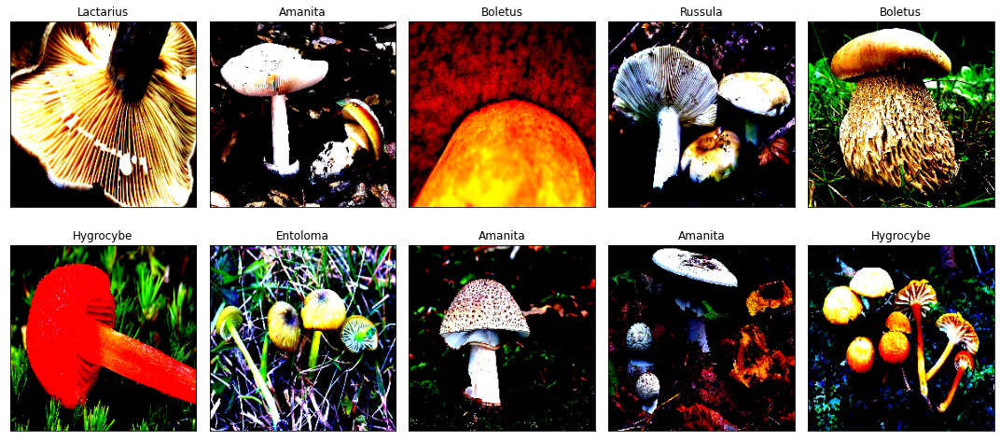

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=(15, 8))
ax = ax.flatten()

images, labels = next(iter(eval_loader))
for idx, img in enumerate(images[:10]):
    ax[idx].imshow(img.permute(1, 2, 0).clip(0, 1))
    ax[idx].set_yticks([])
    ax[idx].set_xticks([])
    ax[idx].set_title(code_map[int(labels[idx].argmax())])
    plt.tight_layout();

# Model

In [ ]:
import pytorch_lightning as pl
from torchmetrics.functional import accuracy
from typing import Dict, List

EPOCHS = 40
BATCHES = len(train_loader)


class Model(nn.Module):
    """
    Torch model that takes in layers of given net
    and adds and extra classification layer on top
    """

    def __init__(self, base: nn.Module):
        super().__init__()
        self.base = nn.Sequential(*list(base.children())[:-1], nn.Flatten())
        self.head = nn.Sequential(
            nn.Linear(base.fc.in_features, 512),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(512, len(genus_map)),
        )

    def forward(self, data: torch.tensor):
        preds = self.head(self.base(data))
        return preds


class ShroomModel(pl.LightningModule):
    def __init__(self, model: nn.Module):
        super().__init__()
        self.model = model

    def forward(self, input: torch.tensor):
        return self.model(input)

    def configure_optimizers(self):
        params = [
            {"params": self.model.base.parameters()},
            {"params": self.model.head.parameters(), "lr": 3e-4},
        ]
        optimizer = torch.optim.Adam(params=params, lr=3e-5)
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optimizer, max_lr=[3e-4, 15e-4], total_steps=EPOCHS * BATCHES
        )
        return [optimizer], [{"scheduler": scheduler, "interval": "step"}]

    def training_step(self, batch: torch.tensor, batch_idx: int):
        input, target = batch
        out = self.model(input)
        loss = F.cross_entropy(out, target)
        acc = accuracy(out.argmax(dim=1), target.argmax(dim=1))
        self.log("train_loss", loss, prog_bar=True)
        return {"loss": loss, "acc": acc}

    def _get_loss_acc(self, outs: List[Dict[str, float]]):
        losses = [i["loss"] for i in outs]
        accs = [i["acc"] for i in outs]
        loss = float(torch.mean(torch.stack(losses)))
        acc = float(torch.mean(torch.stack(accs)))
        return loss, acc

    def training_epoch_end(self, outs: List[Dict[str, float]]):
        loss, acc = self._get_loss_acc(outs)
        self.log("train_loss", loss)
        self.log("train_acc", acc)

    def validation_step(self, batch: torch.tensor, batch_idx: int):
        input, target = batch
        out = self.model(input)
        loss = F.cross_entropy(out, target)
        acc = accuracy(out.argmax(dim=1), target.argmax(dim=1))
        self.log("val_loss", loss, logger=True)
        self.log("val_acc", acc, logger=True)
        return {"loss": loss, "acc": acc}

    def validation_epoch_end(self, outs: List[Dict[str, float]]):
        loss, acc = self._get_loss_acc(outs)
        print(f"EVAL_LOSS: {loss:.4f}, EVAL_ACC: {acc:.4f}")
        self.log("val_loss", loss)
        self.log("val_acc", acc)

    def predict_step(self, batch: torch.tensor, batch_idx: int):
        input, _ = batch
        out = F.softmax(self.model(input), dim=-1)
        return out

For the model backbone will be using ResNet34.

In [ ]:
resnet34 = models.resnet34(weights=models.ResNet34_Weights.DEFAULT)
model34 = Model(resnet34)
# shroom_model = ShroomModel(model34)
shroom_model = ShroomModel.load_from_checkpoint(
    "/content/drive/MyDrive/shroom/lightning_logs/version_116/checkpoints/epoch=39-step=6680.ckpt",
    model=model34,
)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

In [ ]:
from pytorch_lightning.callbacks.early_stopping import EarlyStopping

logger = pl.loggers.csv_logs.CSVLogger("/content/drive/MyDrive/shroom")
early_stop_callback = EarlyStopping(
    monitor="val_acc", patience=10, verbose=False, mode="max"
)
trainer = pl.Trainer(
    default_root_dir="/content/drive/MyDrive/shroom",
    max_epochs=EPOCHS,
    gpus=-1,
    logger=logger,
    callbacks=[early_stop_callback],
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True, used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Best results were gotten training the whole network with seperate learning rates for the base and head parts.

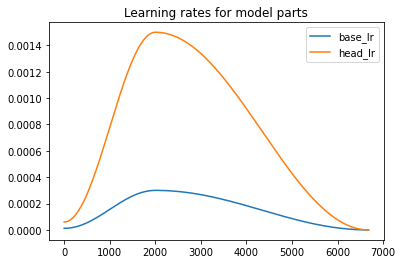

In [ ]:
params = [
    {"params": [torch.tensor([1, 2, 3])]},
    {"params": [torch.tensor([1, 2, 3])], "lr": 3e-4},
]

op = torch.optim.Adam(params=params, lr=3e-5)
sc = torch.optim.lr_scheduler.OneCycleLR(
    op, max_lr=[3e-4, 15e-4], total_steps=EPOCHS * BATCHES
)

lr_base = []
lr_head = []
for i in range(EPOCHS * BATCHES):
    lr_base.append(sc.get_last_lr()[0])
    lr_head.append(sc.get_last_lr()[1])
    op.step()
    sc.step()

plt.plot(lr_base, label="base_lr")
plt.plot(lr_head, label="head_lr")
plt.title("Learning rates for model parts")
plt.legend();

In [ ]:
# trainer.fit(model=shroom_model, train_dataloaders=train_loader, val_dataloaders=eval_loader)

# Model performance

In [ ]:
preds = trainer.predict(shroom_model, test_loader)
preds = torch.concat(preds, dim=0)
y_hat = [code_map[int(pred.argmax())] for pred in preds]

INFO:pytorch_lightning.accelerators.gpu:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

Looking at the model metrics it performs rather well, most errors are made with the rarer classes.

In [ ]:
from sklearn.metrics import classification_report, ConfusionMatrixDisplay

print(classification_report(y_test, y_hat))

              precision    recall  f1-score   support

    Agaricus       0.95      0.95      0.95        21
     Amanita       0.89      0.89      0.89        45
     Boletus       0.95      0.98      0.97        64
 Cortinarius       0.98      0.80      0.88        50
    Entoloma       0.78      0.95      0.86        22
   Hygrocybe       0.90      0.95      0.92        19
   Lactarius       0.92      0.90      0.91        94
     Russula       0.92      0.94      0.93        69
     Suillus       0.75      0.79      0.77        19

    accuracy                           0.91       403
   macro avg       0.89      0.91      0.90       403
weighted avg       0.91      0.91      0.91       403



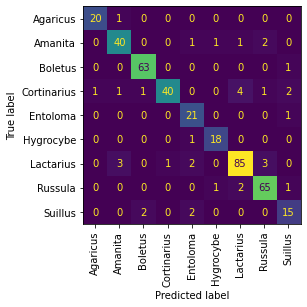

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, y_hat, colorbar=False)
plt.xticks(plt.gca().get_xticks(), rotation=90);

In [ ]:
log_data = pd.read_csv(
    "/content/drive/MyDrive/shroom/lightning_logs/version_116/metrics.csv"
)
log_data = log_data.groupby("epoch").mean()

The trainig set seems to overfit the data looking at the loss and acc metrics, nut the validation data also retains hihg performance, if training further the validation performances starts to diverge, but the training might have been stopped earlier.

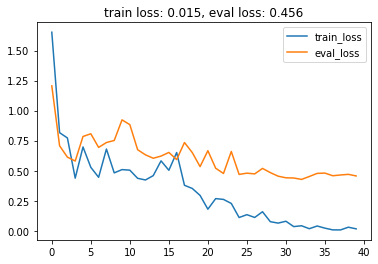

In [ ]:
plt.plot(log_data.index, log_data.train_loss, label="train_loss")
plt.plot(log_data.index, log_data.val_loss, label="eval_loss")
plt.title(
    f"train loss: {log_data.train_loss.iloc[-1]:.3f}, eval loss: {log_data.val_loss.iloc[-1]:.3f}"
)
plt.legend();

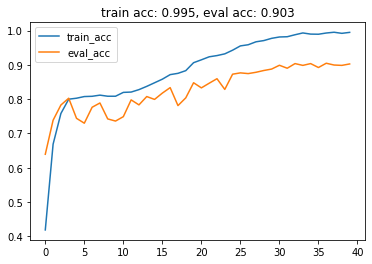

In [ ]:
plt.plot(log_data.index, log_data.train_acc, label="train_acc")
plt.plot(log_data.index, log_data.val_acc, label="eval_acc")
plt.title(
    f"train acc: {log_data.train_acc.iloc[-1]:.3f}, eval acc: {log_data.val_acc.iloc[-1]:.3f}"
)
plt.legend();

In [ ]:
X, y = next(iter(test_loader))

In [ ]:
import random

In [ ]:
%%timeit
random.randint(0, 100)

The slowest run took 14.56 times longer than the fastest. This could mean that an intermediate result is being cached.
1000000 loops, best of 5: 1.02 µs per loop


In [ ]:
%%timeit n=100
shroom_model.cuda()
shroom_model(X[random.randint(0, 100)].unsqueeze(dim=0).cuda())

The slowest run took 9.50 times longer than the fastest. This could mean that an intermediate result is being cached.
100 loops, best of 5: 7.26 ms per loop


In [ ]:
%%timeit n=100
shroom_model.cpu()
shroom_model(X[random.randint(0, 100)].unsqueeze(dim=0).cpu())

1 loop, best of 5: 66.4 ms per loop


The model seems fast enough both on gpu and cpu.

# Prediction visualizations

In [ ]:
def img_trans(img: torch.tensor):
    mean = np.repeat([0.485, 0.456, 0.406], 224 * 224).reshape(3, 224, 224)
    std = np.repeat([0.229, 0.224, 0.225], 224 * 224).reshape(3, 224, 224)
    return ((img * std) + mean).permute(1, 2, 0).clip(0, 1).detach().numpy()

In [ ]:
def get_miss(y_true: torch.tensor, y_pred: torch.tensor):
    fn = y_true != y_pred
    idx = [i for i, j in enumerate(fn) if j]
    return idx


def get_true(y_true: torch.tensor, y_pred: torch.tensor):
    tp = y_true == y_pred
    idx = [i for i, j in enumerate(tp) if j]
    return idx

In [ ]:
true_class = get_true(y.argmax(dim=1), preds.argmax(dim=1))
miss_class = get_miss(y.argmax(dim=1), preds.argmax(dim=1))

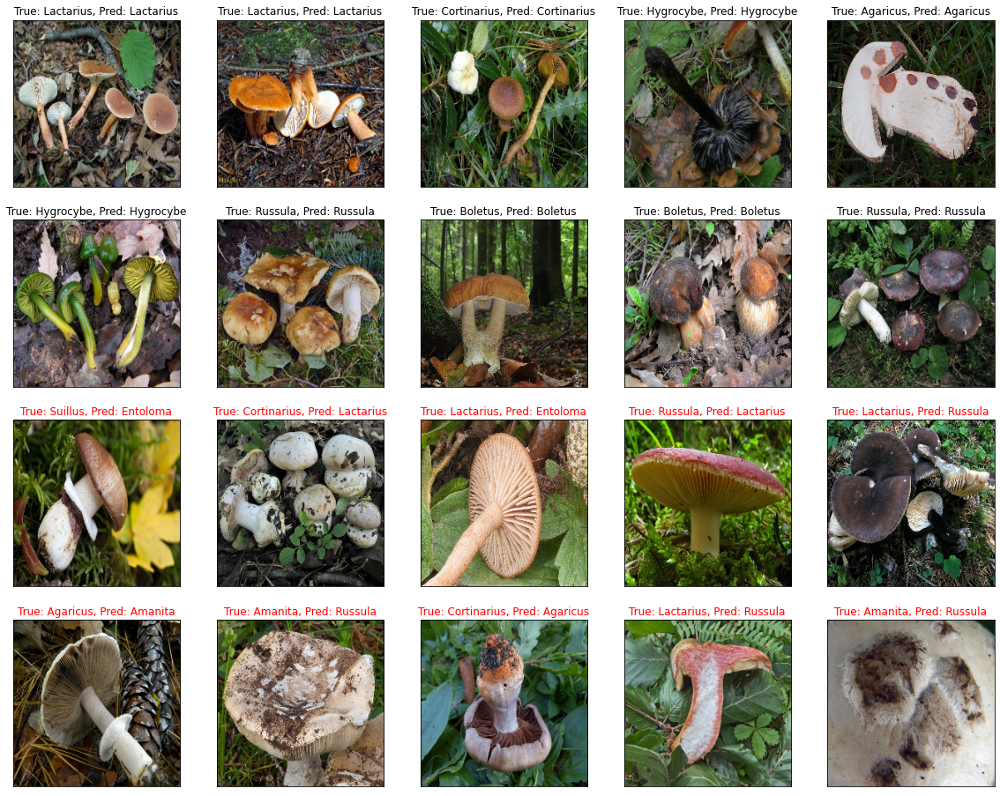

In [ ]:
fig, ax = plt.subplots(4, 5, figsize=(20, 16))
ax = ax.flatten()

true = np.random.choice(true_class, 10, replace=False)
miss = np.random.choice(miss_class, 10, replace=False)
sel = np.r_[true, miss]
for idx, id in enumerate(sel):
    img = img_trans(X[id])
    ax[idx].imshow(img)
    ax[idx].set_yticks([])
    ax[idx].set_xticks([])
    t_label = code_map[int(y[id].argmax())]
    p_label = code_map[int(preds[id].argmax())]
    if t_label != p_label:
        ax[idx].set_title(
            f"True: {t_label}, Pred: {p_label}", fontdict={"color": "red"}
        )
    ax[idx].set_title(f"True: {t_label}, Pred: {p_label}")

Don't see major diferences in right and wrong predictions, the wrong ones might be close ups or only parts of the mushroom at weird angles.

# Class activation maps and guided backpropagation

In [ ]:
def plot_img(img: torch.tensor, y: torch.tensor):
    img = img_trans(img)
    plt.imshow(img)
    plt.gca().set_yticks([])
    plt.gca().set_xticks([])
    plt.title(code_map[int(y.argmax())])

Getting CAM for the last conv layer.

In [ ]:
feat_map = nn.Sequential(
    *(
        list(shroom_model.model.base[:7].children())
        + list(list(shroom_model.model.base[7].children())[:2])
        + list(list(shroom_model.model.base[7].children())[2].children())[:4]
    )
)


def img_to_CAM(model: nn.Module, x: torch.tensor):
    "Get CAM for the last convolution layer in the model"
    model.eval()
    logits = model(x)
    activations = feat_map(x)
    pred = logits.max(-1)[-1]

    model.zero_grad()
    logits[0, pred].backward()
    pooled_grad = list(model.model.base[-3][1].children())[-2].weight.grad.data.mean(
        (0, 2, 3)
    )

    activations *= pooled_grad.reshape(-1, 512, 1, 1)
    heatmap = torch.mean(activations, dim=1)
    heatmap = F.relu(heatmap)

    return heatmap.squeeze().detach().numpy(), code_map[int(pred)]

In [ ]:
def upsample_CAM(cam: np.ndarray, img: torch.tensor):
    "Upsample CAM and superimpose it onto the image"
    m, M = cam.min(), cam.max()
    cam = 255 * ((cam - m) / (M - m))
    cam = cv2.resize(cam, (224, 224))
    cam = np.uint8(cam)
    cam = cv2.applyColorMap(255 - cam, cv2.COLORMAP_JET)
    cam = np.uint8(cam)
    cam = np.uint8(cam * 0.3 + img * 0.7 * 255)
    return cam

In [ ]:
def relu_backward_hook(module: nn.Module, g_in: torch.tensor, g_out: torch.tensor):
    "Remove negative values from from gradients going back from relu"
    if isinstance(module, torch.nn.ReLU):
        return (torch.clamp(g_in[0], min=0.0),)

In [ ]:
def guided_back(x: torch.tensor, y: torch.tensor):
    """Get gradients of the class activations
    with respect to the input image pixels"""
    x.requires_grad = True

    relu_handles = {}
    for i, module in enumerate(model34.modules()):
        if isinstance(module, torch.nn.ReLU):
            module.inplace = False
            relu_handles[i] = module.register_full_backward_hook(relu_backward_hook)

    model34.eval()
    out = model34(x.unsqueeze(dim=0))
    model34.zero_grad()
    out[0, y.argmax()].backward()

    for handle in relu_handles.values():
        handle.remove()

    return x.grad

In [ ]:
def grad_trans(grads: torch.tensor):
    mins = torch.tensor(
        [grads[0, :, :].min(), grads[1, :, :].min(), grads[2, :, :].min()]
    )
    maxs = torch.tensor(
        [grads[0, :, :].max(), grads[1, :, :].max(), grads[2, :, :].max()]
    )
    mins = np.repeat(mins, 224 * 224).reshape(3, 224, 224)
    maxs = np.repeat(maxs, 224 * 224).reshape(3, 224, 224)
    return ((grads - mins) / (maxs - mins)).permute(1, 2, 0)

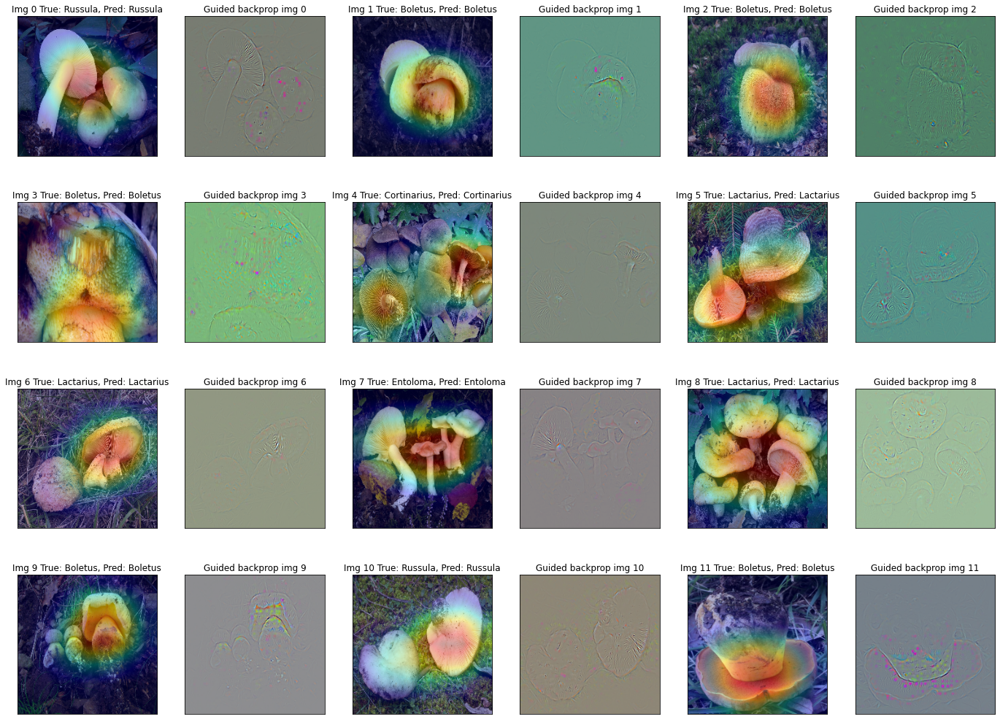

In [ ]:
fig, ax = plt.subplots(4, 6, figsize=(24, 18))
ax = iter(ax.flatten())


def show_img(img: np.ndarray, ax: plt.Axes):
    ax.imshow(img)
    ax.set_yticks([])
    ax.set_xticks([])


sel = np.random.choice(true_class, 12, replace=False)
for idx, id in enumerate(sel):

    cam, pred = img_to_CAM(shroom_model, X[id].unsqueeze(dim=0))
    cam = upsample_CAM(cam, img_trans(X[id]))
    back = (grad_trans(guided_back(X[id], y[id])) * 255).int()

    axi = next(ax)
    show_img(cam, axi)
    t_label = code_map[int(y[id].argmax())]
    p_label = code_map[int(preds[id].argmax())]
    axi.set_title(f"Img {idx} True: {t_label}, Pred: {p_label}")

    axi = next(ax)
    show_img(back, axi)
    axi.set_title(f"Guided backprop img {idx}");

Seems like the model focuses on the mushroom based both on conv layer activations and pixel importances, this seems like a good sign for the classifier because it is not making the decission on data like the background.

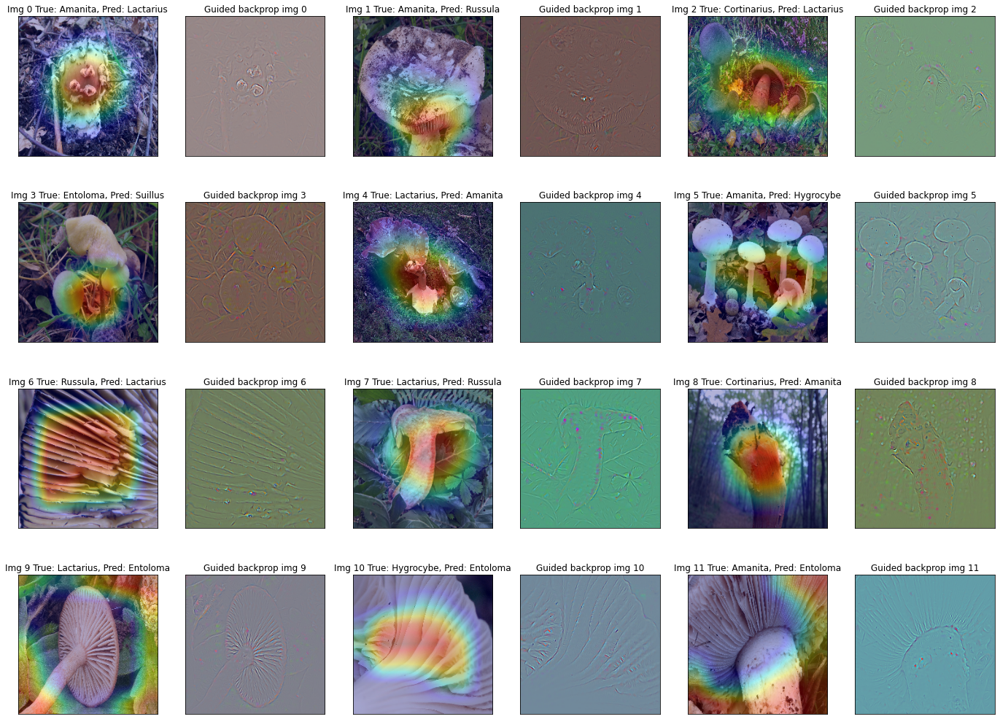

In [ ]:
fig, ax = plt.subplots(4, 6, figsize=(24, 18))
ax = iter(ax.flatten())

sel = np.random.choice(miss_class, 12, replace=False)
for idx, id in enumerate(sel):
    cam, pred = img_to_CAM(shroom_model, X[id].unsqueeze(dim=0))
    cam = upsample_CAM(cam, img_trans(X[id]))
    back = (grad_trans(guided_back(X[id], y[id])) * 255).int()

    axi = next(ax)
    show_img(cam, axi)
    t_label = code_map[int(y[id].argmax())]
    p_label = code_map[int(preds[id].argmax())]
    axi.set_title(f"Img {idx} True: {t_label}, Pred: {p_label}")

    axi = next(ax)
    show_img(back, axi)
    axi.set_title(f"Guided backprop img {idx}");

We see similar results with in missclassified images but in this case for some images CAM values are high for the background, and the pixel importances in some cases also activate on the background.

# Generating class images

Using gradient ascent on gausian noise to maximise target class activations.

In [ ]:
from scipy.ndimage import gaussian_filter

denormalize = T.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
    std=[1 / 0.229, 1 / 0.224, 1 / 0.225],
)


def norm_crop(img: torch.tensor, threshold=0):
    """Crops pixel values across channels
    below specified frobenius norm threshold"""
    norm = torch.norm(img, dim=0)
    norm = norm.numpy()
    smalls = norm < np.percentile(norm, threshold)
    smalls = np.tile(smalls, (3, 1, 1))
    return img - img * smalls


def abs_contrib_crop(img: torch.tensor, threshold=0):
    "Crops pixels values below specified threshold"
    abs_img = torch.abs(img)
    smalls = abs_img < np.percentile(abs_img, threshold)
    return img - img * smalls


def gen_class_images(model: nn.Module, target_class: int):
    """Maximizes model activation for given class
    adds gaussian noise and normalizations to produce
    nicer images"""
    max_activation = -float("inf")
    model.eval()
    model.cuda()
    img = torch.randn(3, 224, 224)
    img = val_trans(img)

    for i in range(1, 501):
        img.requires_grad_(True)
        out = model(img.unsqueeze(dim=0).cuda())
        model.zero_grad()
        out[0][target_class].backward()
        img_grad = img.grad

        with torch.no_grad():
            img = torch.add(img, img_grad * torch.tensor(100))
            img = torch.mul(img, (1.0 - 0.1))
            img = norm_crop(img.detach(), threshold=30)
            img = abs_contrib_crop(img.detach(), threshold=30)

            if i % 4 == 0:  # add gaussian noise every 4 steps
                temp = img.squeeze(0)
                temp = temp.cpu().detach().numpy()
                for channel in range(3):
                    cimg = gaussian_filter(temp[channel], 1)
                    temp[channel] = cimg
                temp = torch.from_numpy(temp)
                img = temp

        if out[0][target_class] > max_activation:
            act = out[0][target_class]
            best_img = img

    return denormalize(best_img)

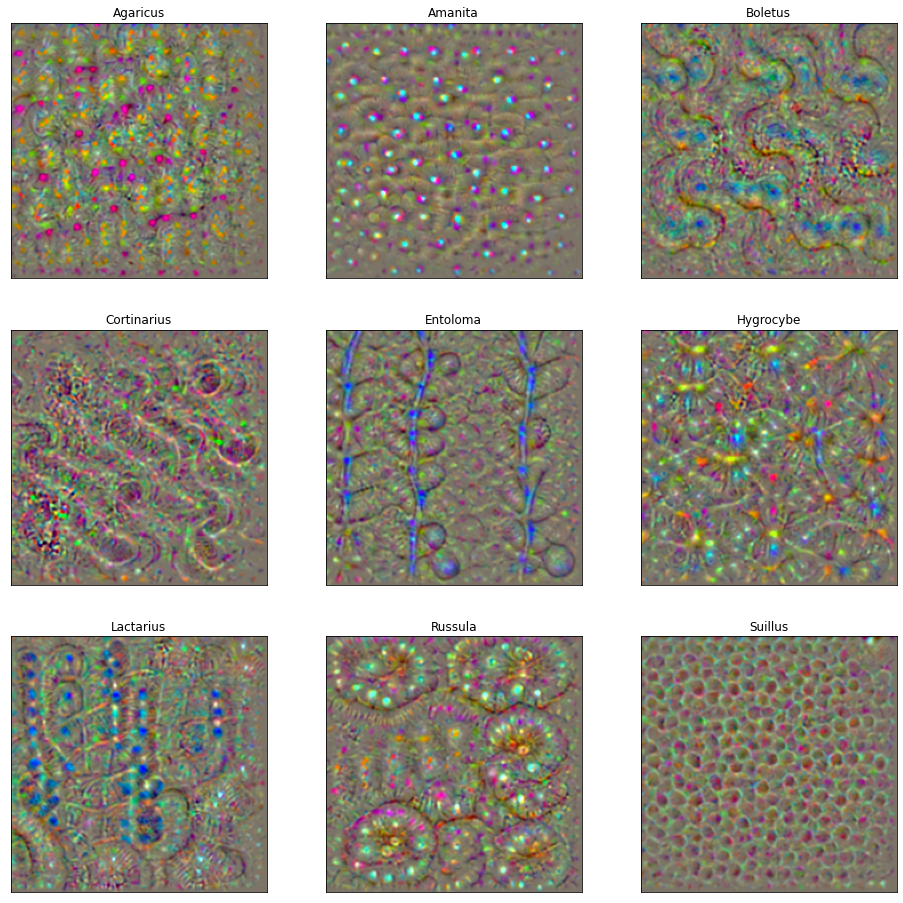

In [ ]:
fig, ax = plt.subplots(3, 3, figsize=(16, 16))
ax = iter(ax.flatten())

for id, name in code_map.items():
    img = gen_class_images(model34, id)
    img = img.squeeze().permute(1, 2, 0).detach().numpy().clip(0, 1)
    axi = next(ax)
    show_img(img, axi)
    axi.set_title(name);

Some class images like Russula and Hygrocybe or Entoloma have better defined shapes, Suillus or Amanita look like closeups of the mushroom. In the end the images for different classes seem rather distinct, this is probably expected because the results of the model are rather good, meaning it can separate the classes.

# Conclusions

* The model performs rather well, but is not perfect and maybe a bit overfitted.
* The model learned distinct representations for the different classes.

# Improvements

* Should add hyperparameter optimizations for this and other models, in this case the parameters were selected manualy.
* Make predictions more implementation oriented i.e. make sure the user would get more info than just the class and could judge the possibility that the shroom might be poisonous.